In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.8/898.8 kB 14.8 MB/s eta 0:00:00


In [ ]:
#Import libs
import ultralytics
import random
import os
from google.colab import drive
from matplotlib import pyplot as plt
import numpy as np

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
#Mount drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
path = "/content/drive/MyDrive/Universidad/Tesis/Datasets/dataset"

In [ ]:
def randomVisualization(path,dataset='train'):
  image = random.choice(os.listdir(path+"/data/"+dataset+"/images"))
  label = image.replace(".JPG", ".txt")
  img = plt.imread(path+"/data/"+dataset+"/images/"+image)
  dim = img.shape
  fig, ax = plt.subplots(1,2, figsize=(10,10))

  labels = ["Tronco","1 año","2 años","3 años o más"]
  colors = ['red','green','yellow','orange']
  lines = []
  with open(path+"/data/"+dataset+"/labels/"+label, "r") as f:
    lines = f.readlines()
  for line in lines:
    coordX = []
    coordY = []
    line = line.split(" ")
    id = int(line[0])
    for i in range(1, len(line)):
      if float(line[i]) == 2.0:
        coordX.append(float(line[i-2])*dim[1])
        coordY.append(float(line[i-1])*dim[0])
    ax[1].plot(coordX, coordY, color = colors[id] ,linewidth=1, marker='o',markersize=2)
  fig.suptitle("Imagen "+image.replace(".JPG","")+" del conjunto "+dataset)
  ax[0].set_title("Original")
  ax[0].axis('off')
  ax[0].imshow(img)
  for i in range(4):
    ax[1].plot([], [], label=labels[i],color=colors[i])
  ax[1].set_title("Etiquetada")
  ax[1].axis('off')
  ax[1].legend()
  ax[1].imshow(img)

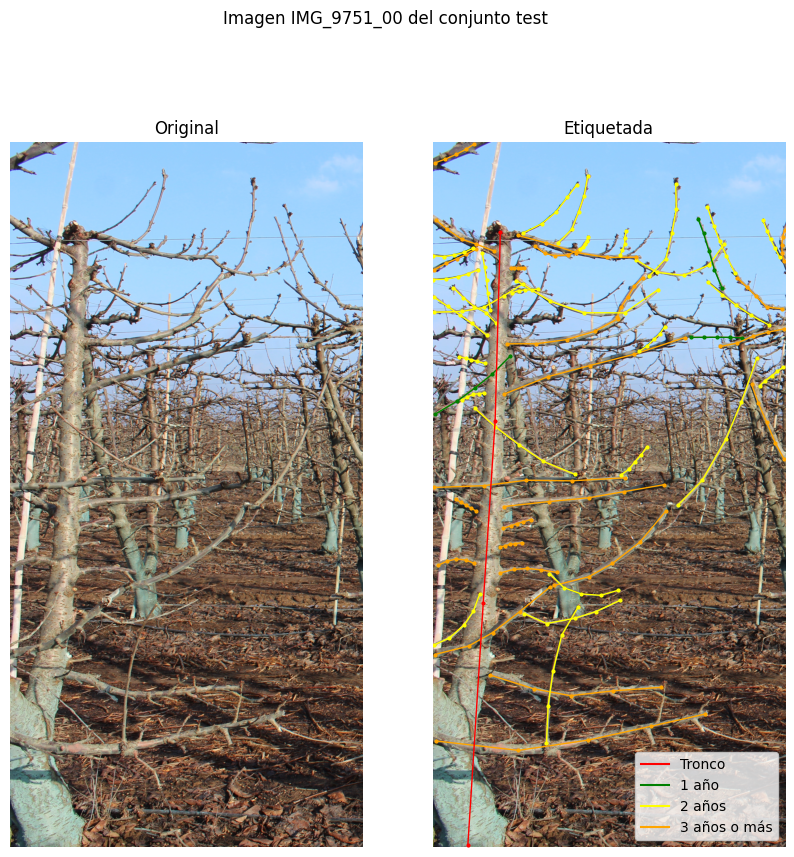

In [ ]:
randomVisualization(path,'test')

In [ ]:
#Load model
model = ultralytics.YOLO('yolo11n-pose.pt')  # build a new model from YAML
#Train model
results = model.train(data=path+"/data.yaml", epochs=200, imgsz=800,fliplr=0.5,batch=16)

100%|██████████| 5.97M/5.97M [00:00<00:00, 74.9MB/s]


Ultralytics 8.3.47 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=pose, mode=train, model=yolo11n-pose.pt, data=/content/drive/MyDrive/Universidad/Tesis/Datasets/dataset/data.yaml, epochs=150, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, sho

100%|██████████| 755k/755k [00:00<00:00, 13.5MB/s]


Overriding model.yaml kpt_shape=[17, 3] with kpt_shape=[5, 3]
Overriding model.yaml nc=80 with nc=4

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True

train: Scanning /content/drive/MyDrive/Universidad/Tesis/Datasets/dataset/data/train/labels... 40 images, 3 backgrounds, 0 corrupt: 100%|██████████| 40/40 [00:27<00:00,  1.45it/s]

train: New cache created: /content/drive/MyDrive/Universidad/Tesis/Datasets/dataset/data/train/labels.cache
WARNING ⚠️ No 'flip_idx' array defined in data.yaml, setting augmentation 'fliplr=0.0'


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.22 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/drive/MyDrive/Universidad/Tesis/Datasets/dataset/data/val/labels... 5 images, 0 backgrounds, 0 corrupt: 100%|██████████| 5/5 [00:03<00:00,  1.46it/s]

val: New cache created: /content/drive/MyDrive/Universidad/Tesis/Datasets/dataset/data/val/labels.cache


Plotting labels to runs/pose/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 87 weight(decay=0.0), 97 weight(decay=0.0005), 96 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/pose/train
Starting training for 150 epochs...

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      1/150         0G      3.794      8.029     0.6377      4.042      2.985        537        640: 100%|██████████| 5/5 [01:09<00:00, 13.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.22s/it]

                   all          5        225    0.00167     0.0045    0.00112   0.000378          0          0          0          0



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      2/150         0G      3.534      8.035     0.6375      3.959      2.703        501        640: 100%|██████████| 5/5 [00:41<00:00,  8.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.04s/it]

                   all          5        225    0.00305    0.00901    0.00165   0.000363          0          0          0          0



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      3/150         0G      3.464      7.896     0.6324      3.858      2.454        409        640: 100%|██████████| 5/5 [00:42<00:00,  8.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.01s/it]

                   all          5        225    0.00805     0.0744    0.00517    0.00122          0          0          0          0



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      4/150         0G      3.333      7.831     0.6333      3.693      2.374        463        640: 100%|██████████| 5/5 [00:39<00:00,  7.92s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.06s/it]

                   all          5        225     0.0139       0.15     0.0151    0.00414          0          0          0          0



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      5/150         0G      3.304      7.753      0.628      3.492      2.205        507        640: 100%|██████████| 5/5 [00:46<00:00,  9.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]

                   all          5        225     0.0175      0.148     0.0133    0.00305          0          0          0          0



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      6/150         0G      3.086      7.663     0.6259      3.295      2.129        563        640: 100%|██████████| 5/5 [00:40<00:00,  8.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]

                   all          5        225    0.00768       0.14    0.00868    0.00203          0          0          0          0



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      7/150         0G      2.999      7.494     0.6194      3.148      2.034        569        640: 100%|██████████| 5/5 [00:42<00:00,  8.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]

                   all          5        225     0.0143      0.119    0.00966    0.00326          0          0          0          0



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      8/150         0G       2.94      7.449     0.6099      3.005      1.996        611        640: 100%|██████████| 5/5 [00:41<00:00,  8.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.02s/it]

                   all          5        225     0.0252      0.127     0.0158    0.00617          0          0          0          0



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      9/150         0G      2.861      7.324     0.6054      2.952      1.979        562        640: 100%|██████████| 5/5 [00:39<00:00,  7.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]

                   all          5        225      0.198      0.067     0.0356     0.0119     0.0002    0.00225   0.000102   3.05e-05



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     10/150         0G      2.799      7.284     0.6024      2.789      1.921        660        640: 100%|██████████| 5/5 [00:42<00:00,  8.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]

                   all          5        225      0.332     0.0873     0.0565     0.0155      0.509    0.00901     0.0013   0.000164



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     11/150         0G      2.793      7.211     0.6016      2.739      1.942        537        640: 100%|██████████| 5/5 [00:43<00:00,  8.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]

                   all          5        225      0.109      0.135     0.0674     0.0241      0.772     0.0135    0.00347   0.000543



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     12/150         0G      2.734      7.177     0.6011      2.669      1.883        361        640: 100%|██████████| 5/5 [00:42<00:00,  8.53s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]

                   all          5        225      0.215      0.102      0.113     0.0356      0.274     0.0135     0.0029   0.000578



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     13/150         0G      2.692       7.11     0.5932      2.638      1.868        573        640: 100%|██████████| 5/5 [00:43<00:00,  8.63s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]

                   all          5        225      0.103      0.178     0.0764     0.0281     0.0268     0.0169    0.00665    0.00164



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     14/150         0G      2.682      7.145     0.5856      2.557      1.821        728        640: 100%|██████████| 5/5 [00:44<00:00,  8.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]

                   all          5        225      0.103      0.178     0.0764     0.0281     0.0268     0.0169    0.00665    0.00164



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     15/150         0G      2.562      7.014     0.5883      2.571      1.816        475        640: 100%|██████████| 5/5 [00:44<00:00,  9.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]

                   all          5        225     0.0633      0.253     0.0674     0.0267      0.039     0.0141     0.0095    0.00232



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     16/150         0G       2.61      7.033      0.572      2.562      1.767        684        640: 100%|██████████| 5/5 [00:40<00:00,  8.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.49s/it]

                   all          5        225      0.149      0.179     0.0947      0.035     0.0357     0.0669      0.014    0.00366



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     17/150         0G      2.552      6.922     0.5683      2.521      1.778        645        640: 100%|██████████| 5/5 [00:42<00:00,  8.45s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.57s/it]

                   all          5        225      0.138      0.191      0.112     0.0323     0.0537      0.055     0.0164    0.00351



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     18/150         0G      2.548       6.84     0.5533      2.432       1.77        809        640: 100%|██████████| 5/5 [00:42<00:00,  8.58s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.61s/it]

                   all          5        225      0.138      0.191      0.112     0.0323     0.0537      0.055     0.0164    0.00351



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     19/150         0G      2.477      6.783      0.557        2.5       1.77        507        640: 100%|██████████| 5/5 [00:39<00:00,  7.93s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]

                   all          5        225      0.106        0.2     0.0806     0.0281     0.0408     0.0487     0.0182    0.00442



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     20/150         0G      2.529      6.838     0.5473      2.401      1.731        460        640: 100%|██████████| 5/5 [00:42<00:00,  8.53s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.24s/it]

                   all          5        225      0.106      0.237     0.0874     0.0332      0.325     0.0482     0.0258    0.00607



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     21/150         0G      2.532      6.789     0.5439       2.39      1.733        847        640: 100%|██████████| 5/5 [00:46<00:00,  9.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]

                   all          5        225      0.106      0.237     0.0874     0.0332      0.325     0.0482     0.0258    0.00607



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     22/150         0G      2.397      6.604     0.5381      2.308      1.661        527        640: 100%|██████████| 5/5 [00:42<00:00,  8.55s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]

                   all          5        225     0.0828      0.184     0.0702     0.0281     0.0481     0.0715      0.026    0.00613



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     23/150         0G      2.378      6.552     0.5453      2.413      1.716        488        640: 100%|██████████| 5/5 [00:41<00:00,  8.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]

                   all          5        225      0.361      0.128     0.0748     0.0344      0.315     0.0839     0.0311    0.00795



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     24/150         0G      2.447      6.624     0.5341      2.332      1.709        662        640: 100%|██████████| 5/5 [00:40<00:00,  8.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.51s/it]

                   all          5        225      0.361      0.128     0.0748     0.0344      0.315     0.0839     0.0311    0.00795



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     25/150         0G      2.375      6.594     0.5378      2.339      1.651        565        640: 100%|██████████| 5/5 [00:39<00:00,  7.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.57s/it]

                   all          5        225      0.395      0.105     0.0841     0.0356       0.31     0.0811     0.0395    0.00872



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     26/150         0G      2.364      6.566     0.5324      2.364      1.669        796        640: 100%|██████████| 5/5 [00:41<00:00,  8.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]

                   all          5        225      0.395      0.105     0.0841     0.0356       0.31     0.0811     0.0395    0.00872



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     27/150         0G      2.306      6.442     0.5321      2.333      1.648        332        640: 100%|██████████| 5/5 [00:40<00:00,  8.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]

                   all          5        225      0.387      0.134      0.107     0.0448      0.347     0.0572     0.0411    0.00999



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     28/150         0G      2.309      6.368     0.5164      2.241      1.613        458        640: 100%|██████████| 5/5 [00:44<00:00,  8.93s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]

                   all          5        225      0.142      0.179     0.0998     0.0442      0.103     0.0754     0.0401     0.0115



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     29/150         0G      2.273      6.449     0.5261       2.24      1.609        622        640: 100%|██████████| 5/5 [00:41<00:00,  8.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]

                   all          5        225      0.142      0.179     0.0998     0.0442      0.103     0.0754     0.0401     0.0115



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     30/150         0G      2.297      6.396     0.5097      2.237        1.6        463        640: 100%|██████████| 5/5 [00:41<00:00,  8.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]

                   all          5        225      0.131      0.137      0.091     0.0416     0.0981      0.081       0.05     0.0141



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     31/150         0G      2.287      6.395     0.5165      2.255      1.617        440        640: 100%|██████████| 5/5 [00:44<00:00,  8.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.87s/it]

                   all          5        225      0.155      0.212     0.0979     0.0445     0.0644      0.175     0.0524      0.013



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     32/150         0G       2.29      6.284     0.5081      2.198      1.593        459        640: 100%|██████████| 5/5 [00:41<00:00,  8.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.82s/it]

                   all          5        225      0.155      0.212     0.0979     0.0445     0.0644      0.175     0.0524      0.013



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     33/150         0G      2.233      6.295     0.5027      2.182      1.575        690        640: 100%|██████████| 5/5 [00:40<00:00,  8.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.88s/it]

                   all          5        225      0.185      0.223      0.116     0.0492      0.109      0.185     0.0667     0.0118



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     34/150         0G      2.239      6.284     0.5036      2.219        1.6        405        640: 100%|██████████| 5/5 [00:41<00:00,  8.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.94s/it]

                   all          5        225      0.185      0.223      0.116     0.0492      0.109      0.185     0.0667     0.0118



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     35/150         0G      2.269        6.2     0.4972      2.153      1.575        514        640: 100%|██████████| 5/5 [00:41<00:00,  8.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.00s/it]

                   all          5        225      0.191       0.24      0.133     0.0438     0.0708      0.169     0.0552     0.0122



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     36/150         0G      2.238      6.191     0.4999      2.188      1.579        525        640: 100%|██████████| 5/5 [00:40<00:00,  8.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.97s/it]

                   all          5        225       0.21       0.23      0.119     0.0332     0.0848     0.0839     0.0409      0.012



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     37/150         0G      2.238      6.222     0.5129      2.205        1.6        546        640: 100%|██████████| 5/5 [00:44<00:00,  8.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.97s/it]

                   all          5        225       0.21       0.23      0.119     0.0332     0.0848     0.0839     0.0409      0.012



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     38/150         0G       2.18      6.171     0.4899      2.143       1.57        545        640: 100%|██████████| 5/5 [00:42<00:00,  8.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.03s/it]

                   all          5        225      0.154      0.272      0.112     0.0363     0.0831      0.101     0.0477     0.0134



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     39/150         0G      2.265      6.288     0.4964      2.129      1.565        702        640: 100%|██████████| 5/5 [00:43<00:00,  8.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.96s/it]

                   all          5        225      0.178      0.194      0.103     0.0384     0.0898      0.077     0.0505     0.0154



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     40/150         0G      2.187      6.042     0.4777      2.084      1.529        579        640: 100%|██████████| 5/5 [00:41<00:00,  8.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.06s/it]

                   all          5        225      0.178      0.194      0.103     0.0384     0.0898      0.077     0.0505     0.0154



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     41/150         0G      2.168      5.993     0.4911      2.137       1.57        426        640: 100%|██████████| 5/5 [00:40<00:00,  8.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.97s/it]

                   all          5        225       0.13      0.151     0.0983     0.0413      0.159      0.184      0.155     0.0404



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     42/150         0G      2.139      5.926     0.4925      2.137      1.548        360        640: 100%|██████████| 5/5 [00:40<00:00,  8.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.93s/it]

                   all          5        225       0.13      0.151     0.0983     0.0413      0.159      0.184      0.155     0.0404



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     43/150         0G      2.125      5.953     0.4678      2.024      1.527        609        640: 100%|██████████| 5/5 [00:40<00:00,  8.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.98s/it]

                   all          5        225      0.207      0.207      0.154     0.0568      0.103      0.192     0.0762     0.0202



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     44/150         0G      2.195      6.036      0.467      2.092      1.535        527        640: 100%|██████████| 5/5 [00:40<00:00,  8.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.93s/it]

                   all          5        225      0.268      0.229      0.185     0.0601      0.152      0.144     0.0774     0.0287



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     45/150         0G       2.13      5.961     0.4826      2.124      1.538        345        640: 100%|██████████| 5/5 [00:40<00:00,  8.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.95s/it]

                   all          5        225      0.268      0.229      0.185     0.0601      0.152      0.144     0.0774     0.0287



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     46/150         0G      2.127      5.834     0.4688      2.025      1.484        428        640: 100%|██████████| 5/5 [00:40<00:00,  8.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.15s/it]

                   all          5        225      0.277      0.279      0.176     0.0673      0.137      0.179     0.0649      0.018



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     47/150         0G      2.067      5.746     0.4679      2.029      1.475        553        640: 100%|██████████| 5/5 [00:44<00:00,  8.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.93s/it]

                   all          5        225      0.277      0.239        0.2     0.0653       0.15      0.188     0.0732     0.0221



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     48/150         0G      2.092      5.826     0.4578       2.04        1.5        443        640: 100%|██████████| 5/5 [00:39<00:00,  7.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.67s/it]

                   all          5        225      0.277      0.239        0.2     0.0653       0.15      0.188     0.0732     0.0221



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     49/150         0G      2.032       5.76     0.4613      1.976      1.456        392        640: 100%|██████████| 5/5 [00:40<00:00,  8.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.95s/it]

                   all          5        225      0.198      0.224      0.122     0.0489      0.155      0.191     0.0805     0.0246



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     50/150         0G      2.071      5.747     0.4694      2.023      1.481        534        640: 100%|██████████| 5/5 [00:40<00:00,  8.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.97s/it]

                   all          5        225      0.198      0.224      0.122     0.0489      0.155      0.191     0.0805     0.0246



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     51/150         0G      2.031      5.741     0.4626      1.996      1.472        328        640: 100%|██████████| 5/5 [00:45<00:00,  9.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.97s/it]

                   all          5        225      0.336      0.222      0.206     0.0644      0.257      0.138      0.118     0.0393



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     52/150         0G      1.992      5.718     0.4599      1.981      1.445        463        640: 100%|██████████| 5/5 [00:39<00:00,  7.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.58s/it]

                   all          5        225      0.293      0.207      0.191     0.0759      0.193      0.145      0.121     0.0397



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     53/150         0G      2.056      5.684      0.451      1.941      1.454        663        640: 100%|██████████| 5/5 [00:42<00:00,  8.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.74s/it]

                   all          5        225      0.293      0.207      0.191     0.0759      0.193      0.145      0.121     0.0397



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     54/150         0G      2.053      5.699     0.4464      1.942      1.459        778        640: 100%|██████████| 5/5 [00:40<00:00,  8.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.27s/it]

                   all          5        225      0.222      0.227      0.201     0.0924       0.17      0.186      0.137     0.0478



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     55/150         0G      2.007      5.552      0.444      2.022      1.449        595        640: 100%|██████████| 5/5 [00:39<00:00,  7.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]

                   all          5        225      0.291      0.206      0.199     0.0858      0.155      0.137      0.111     0.0387



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     56/150         0G      2.023       5.64     0.4468      1.942       1.45        489        640: 100%|██████████| 5/5 [00:41<00:00,  8.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]

                   all          5        225      0.291      0.206      0.199     0.0858      0.155      0.137      0.111     0.0387



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     57/150         0G      1.993      5.589     0.4588      1.975      1.457        777        640: 100%|██████████| 5/5 [00:39<00:00,  7.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.38s/it]

                   all          5        225      0.327      0.192       0.19     0.0655      0.135      0.132      0.103     0.0293



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     58/150         0G      2.022      5.593     0.4408      1.941      1.433        529        640: 100%|██████████| 5/5 [00:42<00:00,  8.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.36s/it]

                   all          5        225      0.327      0.192       0.19     0.0655      0.135      0.132      0.103     0.0293



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     59/150         0G       2.02      5.578     0.4437      1.951      1.431        451        640: 100%|██████████| 5/5 [00:41<00:00,  8.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]

                   all          5        225      0.222      0.269      0.162     0.0549      0.152      0.148      0.102      0.039



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     60/150         0G      1.985      5.489     0.4332      1.882       1.43        612        640: 100%|██████████| 5/5 [00:41<00:00,  8.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]

                   all          5        225       0.29      0.223      0.194     0.0618      0.167      0.155      0.114     0.0352



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     61/150         0G      1.902        5.4     0.4284      1.865      1.379        578        640: 100%|██████████| 5/5 [00:43<00:00,  8.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]

                   all          5        225       0.29      0.223      0.194     0.0618      0.167      0.155      0.114     0.0352



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     62/150         0G      1.998      5.588     0.4354      1.892      1.422        718        640: 100%|██████████| 5/5 [00:43<00:00,  8.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]

                   all          5        225      0.258      0.226      0.192     0.0743      0.155       0.14      0.106     0.0311



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     63/150         0G      1.915      5.312     0.4142      1.856      1.369        453        640: 100%|██████████| 5/5 [00:42<00:00,  8.53s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.89s/it]

                   all          5        225      0.283      0.211      0.174     0.0719      0.166       0.12      0.103     0.0258



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     64/150         0G       1.95      5.462      0.435      1.884      1.409        423        640: 100%|██████████| 5/5 [00:38<00:00,  7.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.92s/it]

                   all          5        225      0.283      0.211      0.174     0.0719      0.166       0.12      0.103     0.0258



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     65/150         0G       1.96      5.508      0.433      1.927      1.416        407        640: 100%|██████████| 5/5 [00:42<00:00,  8.58s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]

                   all          5        225      0.275      0.222       0.19      0.082      0.127       0.17      0.114     0.0358



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     66/150         0G      1.941      5.362     0.4247      1.849        1.4        423        640: 100%|██████████| 5/5 [00:41<00:00,  8.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]

                   all          5        225      0.275      0.222       0.19      0.082      0.127       0.17      0.114     0.0358



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     67/150         0G       1.91      5.283     0.4255      1.839      1.404        535        640: 100%|██████████| 5/5 [00:41<00:00,  8.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]

                   all          5        225      0.341      0.193      0.199      0.072      0.162      0.127      0.117     0.0438



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     68/150         0G      1.973      5.351     0.4186      1.806      1.374        626        640: 100%|██████████| 5/5 [00:43<00:00,  8.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]

                   all          5        225      0.267      0.221      0.195     0.0692      0.146      0.162      0.118     0.0443



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     69/150         0G      1.912      5.249     0.4249      1.824      1.384        522        640: 100%|██████████| 5/5 [00:43<00:00,  8.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]

                   all          5        225      0.267      0.221      0.195     0.0692      0.146      0.162      0.118     0.0443



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     70/150         0G      1.901      5.262     0.4256       1.83       1.36        528        640: 100%|██████████| 5/5 [00:39<00:00,  7.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.42s/it]

                   all          5        225       0.22      0.218      0.155     0.0699      0.164      0.145       0.11     0.0379



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     71/150         0G      1.904      5.182      0.413      1.836      1.386        601        640: 100%|██████████| 5/5 [00:39<00:00,  7.90s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.65s/it]

                   all          5        225       0.29      0.172      0.138     0.0652      0.169      0.116      0.088     0.0339



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     72/150         0G      1.882      5.198     0.4237      1.804      1.371        720        640: 100%|██████████| 5/5 [00:40<00:00,  8.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]

                   all          5        225       0.29      0.172      0.138     0.0652      0.169      0.116      0.088     0.0339



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     73/150         0G      1.848      5.125     0.4077       1.78       1.36        516        640: 100%|██████████| 5/5 [00:41<00:00,  8.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]

                   all          5        225      0.236      0.211      0.133     0.0654      0.159      0.137     0.0749     0.0289



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     74/150         0G      1.853      5.144     0.4206       1.81       1.36        499        640: 100%|██████████| 5/5 [00:40<00:00,  8.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.59s/it]

                   all          5        225      0.236      0.211      0.133     0.0654      0.159      0.137     0.0749     0.0289



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     75/150         0G      1.878      5.065     0.4167       1.83      1.372        628        640: 100%|██████████| 5/5 [00:40<00:00,  8.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.56s/it]

                   all          5        225      0.185       0.26      0.117     0.0524      0.113      0.201     0.0731     0.0284



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     76/150         0G      1.875      5.186     0.4128      1.797      1.363        453        640: 100%|██████████| 5/5 [00:40<00:00,  8.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.34s/it]

                   all          5        225      0.227      0.256      0.153     0.0638      0.142      0.157     0.0766     0.0321



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     77/150         0G       1.84      4.936     0.4159      1.734      1.338        546        640: 100%|██████████| 5/5 [00:39<00:00,  7.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]

                   all          5        225      0.227      0.256      0.153     0.0638      0.142      0.157     0.0766     0.0321



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     78/150         0G      1.828      4.954     0.4091      1.726      1.342        566        640: 100%|██████████| 5/5 [00:41<00:00,  8.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]

                   all          5        225       0.37      0.203      0.187     0.0811      0.186       0.14      0.106     0.0479



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     79/150         0G      1.883      5.143     0.4074      1.732      1.344        636        640: 100%|██████████| 5/5 [00:42<00:00,  8.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]

                   all          5        225      0.357      0.188      0.188     0.0862      0.182      0.132      0.114     0.0514



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     80/150         0G      1.872      4.999     0.3955      1.741      1.322        761        640: 100%|██████████| 5/5 [00:43<00:00,  8.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]

                   all          5        225      0.357      0.188      0.188     0.0862      0.182      0.132      0.114     0.0514



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     81/150         0G      1.852      4.939     0.4075      1.748       1.32        592        640: 100%|██████████| 5/5 [00:40<00:00,  8.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.55s/it]

                   all          5        225      0.397      0.157      0.185      0.102      0.269      0.141      0.122     0.0494



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     82/150         0G      1.809      4.939     0.4019      1.699       1.33        495        640: 100%|██████████| 5/5 [00:39<00:00,  7.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]

                   all          5        225      0.397      0.157      0.185      0.102      0.269      0.141      0.122     0.0494



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     83/150         0G      1.851      4.907      0.405      1.684      1.299        602        640: 100%|██████████| 5/5 [00:41<00:00,  8.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]

                   all          5        225      0.408      0.167      0.181     0.0849       0.28      0.137      0.127     0.0408



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     84/150         0G      1.856      4.946     0.4118      1.756      1.371        483        640: 100%|██████████| 5/5 [00:40<00:00,  8.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]

                   all          5        225      0.354      0.186       0.18     0.0793      0.147      0.222       0.12     0.0369



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     85/150         0G      1.915       5.04      0.409      1.769      1.362        546        640: 100%|██████████| 5/5 [00:43<00:00,  8.66s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.17s/it]

                   all          5        225      0.354      0.186       0.18     0.0793      0.147      0.222       0.12     0.0369



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     86/150         0G      1.811      4.759     0.3944      1.694      1.326        402        640: 100%|██████████| 5/5 [00:40<00:00,  8.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.35s/it]

                   all          5        225      0.386      0.168      0.173      0.072      0.166      0.243      0.119     0.0491



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     87/150         0G       1.81      4.905     0.3921      1.683      1.321        463        640: 100%|██████████| 5/5 [00:42<00:00,  8.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.22s/it]

                   all          5        225       0.35      0.173      0.179     0.0667       0.34      0.131      0.154     0.0535



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     88/150         0G        1.8      4.891     0.4013      1.736      1.345        381        640: 100%|██████████| 5/5 [00:39<00:00,  7.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]

                   all          5        225       0.35      0.173      0.179     0.0667       0.34      0.131      0.154     0.0535



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     89/150         0G      1.829      4.922     0.4039       1.71      1.341        441        640: 100%|██████████| 5/5 [00:42<00:00,  8.59s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]

                   all          5        225      0.322      0.189       0.18     0.0588      0.266      0.141      0.147     0.0587



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     90/150         0G      1.807      4.782     0.3936      1.683        1.3        450        640: 100%|██████████| 5/5 [00:43<00:00,  8.73s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]

                   all          5        225      0.322      0.189       0.18     0.0588      0.266      0.141      0.147     0.0587



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     91/150         0G      1.731      4.705     0.3881      1.673      1.309        599        640: 100%|██████████| 5/5 [00:41<00:00,  8.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]

                   all          5        225      0.385      0.162      0.175     0.0596      0.321      0.134      0.147     0.0577



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     92/150         0G      1.812      4.787     0.3974      1.716      1.335        535        640: 100%|██████████| 5/5 [00:40<00:00,  8.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.39s/it]

                   all          5        225      0.238      0.204      0.177     0.0741      0.154      0.162      0.104     0.0547



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     93/150         0G      1.818      4.846     0.3872      1.657      1.309        722        640: 100%|██████████| 5/5 [00:39<00:00,  7.93s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.01s/it]

                   all          5        225      0.238      0.204      0.177     0.0741      0.154      0.162      0.104     0.0547



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     94/150         0G      1.873      4.895     0.3824      1.682      1.316        568        640: 100%|██████████| 5/5 [00:40<00:00,  8.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]

                   all          5        225      0.267      0.197      0.177     0.0833      0.185      0.176      0.113     0.0488



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     95/150         0G      1.759      4.671     0.4063      1.626      1.304        532        640: 100%|██████████| 5/5 [00:42<00:00,  8.52s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.96s/it]

                   all          5        225      0.285      0.224      0.182     0.0836        0.2      0.186      0.117     0.0564



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     96/150         0G      1.735      4.598     0.3952      1.671      1.293        438        640: 100%|██████████| 5/5 [00:38<00:00,  7.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.35s/it]

                   all          5        225      0.285      0.224      0.182     0.0836        0.2      0.186      0.117     0.0564



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     97/150         0G      1.722      4.531     0.3818      1.627       1.28        485        640: 100%|██████████| 5/5 [00:38<00:00,  7.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.95s/it]

                   all          5        225       0.28      0.235      0.189      0.084      0.189      0.186      0.116     0.0425



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     98/150         0G      1.714      4.623      0.383      1.587      1.262        514        640: 100%|██████████| 5/5 [00:40<00:00,  8.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]

                   all          5        225       0.28      0.235      0.189      0.084      0.189      0.186      0.116     0.0425



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     99/150         0G      1.755      4.592     0.3794      1.612       1.28        514        640: 100%|██████████| 5/5 [00:43<00:00,  8.71s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]

                   all          5        225      0.285      0.231      0.181     0.0723      0.199      0.188       0.11     0.0522



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    100/150         0G      1.745      4.685     0.3901      1.631      1.318        628        640: 100%|██████████| 5/5 [00:42<00:00,  8.58s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]

                   all          5        225      0.315      0.194      0.177     0.0627      0.185      0.154      0.113     0.0608



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    101/150         0G      1.696      4.442     0.3842      1.563      1.261        535        640: 100%|██████████| 5/5 [00:47<00:00,  9.52s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]

                   all          5        225      0.315      0.194      0.177     0.0627      0.185      0.154      0.113     0.0608



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    102/150         0G      1.739      4.591     0.3865      1.627      1.296        518        640: 100%|██████████| 5/5 [00:41<00:00,  8.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]

                   all          5        225      0.307      0.193      0.177     0.0589      0.185      0.159      0.114     0.0606



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    103/150         0G      1.747      4.497     0.3759      1.609       1.28        465        640: 100%|██████████| 5/5 [00:42<00:00,  8.51s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]

                   all          5        225      0.282      0.195      0.182     0.0664      0.186      0.153      0.118     0.0675



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    104/150         0G      1.738      4.548     0.3882      1.598      1.301        465        640: 100%|██████████| 5/5 [00:39<00:00,  7.98s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.10s/it]

                   all          5        225      0.282      0.195      0.182     0.0664      0.186      0.153      0.118     0.0675



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    105/150         0G       1.73      4.568     0.3704      1.565      1.267        613        640: 100%|██████████| 5/5 [00:41<00:00,  8.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.90s/it]

                   all          5        225      0.289      0.198       0.18     0.0727      0.182      0.151      0.118      0.068



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    106/150         0G      1.759      4.571     0.3843      1.601      1.294        395        640: 100%|██████████| 5/5 [00:42<00:00,  8.55s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]

                   all          5        225      0.289      0.198       0.18     0.0727      0.182      0.151      0.118      0.068



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    107/150         0G      1.732      4.493     0.3725      1.538      1.256        601        640: 100%|██████████| 5/5 [00:46<00:00,  9.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]

                   all          5        225      0.296      0.193      0.183     0.0844      0.194       0.19      0.163      0.071



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    108/150         0G       1.69      4.512     0.3813       1.57      1.279        351        640: 100%|██████████| 5/5 [00:42<00:00,  8.56s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]

                   all          5        225      0.278      0.208      0.186     0.0896      0.207      0.221      0.183     0.0753



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    109/150         0G       1.69      4.446     0.3811      1.568      1.272        642        640: 100%|██████████| 5/5 [00:42<00:00,  8.56s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]

                   all          5        225      0.278      0.208      0.186     0.0896      0.207      0.221      0.183     0.0753



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    110/150         0G      1.769      4.495     0.3752      1.608      1.317        515        640: 100%|██████████| 5/5 [00:42<00:00,  8.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.18s/it]

                   all          5        225      0.292      0.213      0.185     0.0865      0.247      0.211      0.163      0.064



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    111/150         0G      1.686      4.409     0.3673      1.526      1.266        646        640: 100%|██████████| 5/5 [00:43<00:00,  8.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]

                   all          5        225      0.277       0.22      0.189     0.0757      0.253      0.204      0.162     0.0646



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    112/150         0G      1.626      4.247     0.3836      1.545      1.265        485        640: 100%|██████████| 5/5 [00:40<00:00,  8.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]

                   all          5        225      0.277       0.22      0.189     0.0757      0.253      0.204      0.162     0.0646



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    113/150         0G       1.74      4.414     0.3759      1.579      1.282        491        640: 100%|██████████| 5/5 [00:41<00:00,  8.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.15s/it]

                   all          5        225      0.285      0.215      0.187     0.0723       0.24      0.206      0.157     0.0616



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    114/150         0G      1.706      4.459     0.3795      1.563      1.269        697        640: 100%|██████████| 5/5 [00:43<00:00,  8.64s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.23s/it]

                   all          5        225      0.285      0.215      0.187     0.0723       0.24      0.206      0.157     0.0616



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    115/150         0G       1.66      4.366     0.3831      1.522      1.248        798        640: 100%|██████████| 5/5 [00:40<00:00,  8.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.20s/it]

                   all          5        225      0.316      0.197      0.176     0.0626      0.231      0.212      0.135     0.0526



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    116/150         0G      1.671      4.266     0.3725      1.531      1.245        611        640: 100%|██████████| 5/5 [00:43<00:00,  8.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]

                   all          5        225      0.324      0.179      0.172      0.055      0.162      0.157      0.108     0.0547



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    117/150         0G      1.695      4.409      0.379      1.537      1.278        709        640: 100%|██████████| 5/5 [00:43<00:00,  8.60s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.49s/it]

                   all          5        225      0.324      0.179      0.172      0.055      0.162      0.157      0.108     0.0547



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    118/150         0G      1.671      4.401     0.3938      1.575      1.276        464        640: 100%|██████████| 5/5 [00:42<00:00,  8.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]

                   all          5        225      0.397       0.16      0.172     0.0592      0.172      0.204      0.125     0.0601



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    119/150         0G      1.666      4.264     0.3787      1.544      1.268        453        640: 100%|██████████| 5/5 [00:43<00:00,  8.71s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]

                   all          5        225       0.33      0.163      0.171     0.0671      0.314      0.151      0.141     0.0692



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    120/150         0G      1.706      4.308     0.3875      1.563      1.273        392        640: 100%|██████████| 5/5 [00:43<00:00,  8.73s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.14s/it]

                   all          5        225       0.33      0.163      0.171     0.0671      0.314      0.151      0.141     0.0692



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    121/150         0G      1.659      4.355     0.3729      1.521      1.248        644        640: 100%|██████████| 5/5 [00:42<00:00,  8.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]

                   all          5        225       0.23      0.192      0.171     0.0738      0.265      0.153      0.158     0.0765



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    122/150         0G      1.673      4.353     0.3694      1.512      1.247        587        640: 100%|██████████| 5/5 [00:41<00:00,  8.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]

                   all          5        225       0.23      0.192      0.171     0.0738      0.265      0.153      0.158     0.0765



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    123/150         0G      1.689      4.338     0.3562      1.528      1.254        836        640: 100%|██████████| 5/5 [00:42<00:00,  8.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.18s/it]

                   all          5        225      0.382      0.156       0.17     0.0706      0.264      0.141      0.157      0.076



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    124/150         0G      1.606      4.045     0.3717      1.488      1.225        435        640: 100%|██████████| 5/5 [00:39<00:00,  7.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]

                   all          5        225      0.248      0.212      0.171     0.0678      0.391      0.176        0.2     0.0899



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    125/150         0G      1.644      4.163     0.3636      1.495      1.236        431        640: 100%|██████████| 5/5 [00:39<00:00,  7.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]

                   all          5        225      0.248      0.212      0.171     0.0678      0.391      0.176        0.2     0.0899



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    126/150         0G      1.608      4.191     0.3674      1.521      1.219        553        640: 100%|██████████| 5/5 [00:45<00:00,  9.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.49s/it]

                   all          5        225      0.256      0.215      0.174     0.0658      0.402      0.175      0.198     0.0944



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    127/150         0G      1.683      4.314     0.3685      1.487      1.221        641        640: 100%|██████████| 5/5 [00:41<00:00,  8.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]

                   all          5        225      0.258       0.21      0.178     0.0677       0.41      0.176      0.201     0.0953



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    128/150         0G      1.617      4.179     0.3741      1.495       1.25        486        640: 100%|██████████| 5/5 [00:38<00:00,  7.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.18s/it]

                   all          5        225      0.258       0.21      0.178     0.0677       0.41      0.176      0.201     0.0953



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    129/150         0G      1.629      4.197     0.3787      1.507      1.248        498        640: 100%|██████████| 5/5 [00:41<00:00,  8.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]

                   all          5        225      0.275      0.201      0.173     0.0662      0.237      0.191      0.158     0.0796



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    130/150         0G      1.641      4.285     0.3803      1.513      1.262        325        640: 100%|██████████| 5/5 [00:42<00:00,  8.54s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]

                   all          5        225      0.275      0.201      0.173     0.0662      0.237      0.191      0.158     0.0796



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    131/150         0G      1.642      4.269      0.383      1.493      1.256        675        640: 100%|██████████| 5/5 [00:44<00:00,  8.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]

                   all          5        225      0.307      0.194      0.172     0.0692      0.258      0.193       0.16      0.089



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    132/150         0G      1.653      4.242     0.3799      1.545      1.258        256        640: 100%|██████████| 5/5 [00:40<00:00,  8.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.17s/it]

                   all          5        225      0.299      0.192      0.173     0.0633      0.258      0.197      0.161     0.0791



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    133/150         0G      1.643      4.136     0.3751      1.489      1.257        496        640: 100%|██████████| 5/5 [00:40<00:00,  8.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.06s/it]

                   all          5        225      0.299      0.192      0.173     0.0633      0.258      0.197      0.161     0.0791



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    134/150         0G      1.616      4.143     0.3746       1.49      1.245        561        640: 100%|██████████| 5/5 [00:41<00:00,  8.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]

                   all          5        225      0.269      0.206      0.174     0.0611      0.269      0.168       0.16     0.0805



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    135/150         0G      1.656      4.302     0.3818      1.546      1.249        363        640: 100%|██████████| 5/5 [00:43<00:00,  8.62s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]

                   all          5        225      0.271      0.206      0.175     0.0591      0.276      0.176       0.16     0.0842



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    136/150         0G       1.69      4.136     0.3668      1.475      1.235        696        640: 100%|██████████| 5/5 [00:44<00:00,  8.93s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]

                   all          5        225      0.271      0.206      0.175     0.0591      0.276      0.176       0.16     0.0842



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    137/150         0G      1.642      4.155     0.3685      1.475      1.249        564        640: 100%|██████████| 5/5 [00:40<00:00,  8.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.03s/it]

                   all          5        225      0.296      0.201      0.175     0.0593      0.273      0.183      0.161     0.0843



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    138/150         0G      1.606      4.148     0.3842      1.491      1.237        638        640: 100%|██████████| 5/5 [00:39<00:00,  7.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.15s/it]

                   all          5        225      0.296      0.201      0.175     0.0593      0.273      0.183      0.161     0.0843



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    139/150         0G      1.597       4.05     0.3584      1.431       1.21        661        640: 100%|██████████| 5/5 [00:40<00:00,  8.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]

                   all          5        225      0.298      0.187      0.176     0.0588      0.338      0.235      0.194     0.0885



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    140/150         0G      1.605      4.126     0.3649      1.444       1.21        582        640: 100%|██████████| 5/5 [00:40<00:00,  8.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]

                   all          5        225      0.334      0.184      0.177     0.0592      0.269      0.211      0.163     0.0904


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    141/150         0G      1.733      4.121     0.2701      1.788      1.275        274        640: 100%|██████████| 5/5 [00:49<00:00,  9.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]

                   all          5        225      0.334      0.184      0.177     0.0592      0.269      0.211      0.163     0.0904



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    142/150         0G      1.619      3.907     0.2779      1.666      1.252        182        640: 100%|██████████| 5/5 [00:38<00:00,  7.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.49s/it]

                   all          5        225      0.347      0.199      0.175     0.0644      0.305      0.257      0.195     0.0888



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    143/150         0G       1.64      3.996     0.2896      1.693      1.274        265        640: 100%|██████████| 5/5 [00:36<00:00,  7.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]

                   all          5        225      0.317      0.211      0.173     0.0663      0.296      0.213      0.161      0.084



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    144/150         0G      1.665      4.068     0.2777      1.784      1.279        328        640: 100%|██████████| 5/5 [00:37<00:00,  7.53s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]

                   all          5        225      0.317      0.211      0.173     0.0663      0.296      0.213      0.161      0.084



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    145/150         0G      1.617      3.971      0.278      1.667      1.239        239        640: 100%|██████████| 5/5 [00:35<00:00,  7.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.94s/it]

                   all          5        225      0.313      0.217      0.177     0.0662      0.294      0.216      0.162     0.0837



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    146/150         0G      1.653       4.19     0.2807       1.71      1.251        254        640: 100%|██████████| 5/5 [00:38<00:00,  7.71s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]

                   all          5        225      0.313      0.217      0.177     0.0662      0.294      0.216      0.162     0.0837



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    147/150         0G      1.632       4.04     0.2777      1.637      1.251        308        640: 100%|██████████| 5/5 [00:37<00:00,  7.45s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.36s/it]

                   all          5        225      0.323      0.211      0.175     0.0648      0.288      0.228      0.166     0.0838



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    148/150         0G      1.649      3.984     0.2737      1.684      1.246        284        640: 100%|██████████| 5/5 [00:36<00:00,  7.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]

                   all          5        225       0.32      0.216      0.177     0.0655      0.264      0.241      0.168     0.0841



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    149/150         0G      1.564      3.858     0.2872      1.598      1.261        230        640: 100%|██████████| 5/5 [00:37<00:00,  7.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.01s/it]

                   all          5        225       0.32      0.216      0.177     0.0655      0.264      0.241      0.168     0.0841



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    150/150         0G      1.573      3.912     0.2748      1.584      1.244        298        640: 100%|██████████| 5/5 [00:36<00:00,  7.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]

                   all          5        225      0.321      0.219      0.175     0.0667      0.289      0.239      0.166      0.084



150 epochs completed in 1.860 hours.
Optimizer stripped from runs/pose/train/weights/last.pt, 5.6MB
Optimizer stripped from runs/pose/train/weights/best.pt, 5.6MB

Validating runs/pose/train/weights/best.pt...
Ultralytics 8.3.47 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
YOLO11n-pose summary (fused): 257 layers, 2,655,217 parameters, 0 gradients, 6.6 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


                   all          5        225      0.279      0.208      0.186     0.0896      0.206       0.22      0.183     0.0755
                 trunk          3          6      0.374      0.333      0.359      0.182      0.305       0.37      0.422      0.168
              1yearold          5         20     0.0957       0.15     0.0406     0.0164      0.039        0.1     0.0146    0.00676
              2yearold          5         88      0.438       0.17      0.234      0.113      0.324      0.193      0.198     0.0942
        3ormoreyearold          5        111      0.208       0.18      0.111     0.0473      0.157      0.216     0.0955     0.0328
Speed: 1.3ms preprocess, 186.4ms inference, 0.0ms loss, 54.2ms postprocess per image
Results saved to runs/pose/train


In [ ]:
!zip -r /content/drive/MyDrive/Universidad/Tesis/yolo11n_colab.zip /content/runs

  adding: content/runs/ (stored 0%)
  adding: content/runs/pose/ (stored 0%)
  adding: content/runs/pose/train/ (stored 0%)
  adding: content/runs/pose/train/args.yaml (deflated 52%)
  adding: content/runs/pose/train/train_batch2.jpg (deflated 3%)
  adding: content/runs/pose/train/PoseR_curve.png (deflated 16%)
  adding: content/runs/pose/train/confusion_matrix_normalized.png (deflated 25%)
  adding: content/runs/pose/train/PosePR_curve.png (deflated 16%)
  adding: content/runs/pose/train/BoxR_curve.png (deflated 16%)
  adding: content/runs/pose/train/train_batch1.jpg (deflated 3%)
  adding: content/runs/pose/train/BoxPR_curve.png (deflated 16%)
  adding: content/runs/pose/train/results.csv (deflated 67%)
  adding: content/runs/pose/train/PoseP_curve.png (deflated 9%)
  adding: content/runs/pose/train/train_batch0.jpg (deflated 4%)
  adding: content/runs/pose/train/BoxP_curve.png (deflated 8%)
  adding: content/runs/pose/train/confusion_matrix.png (deflated 29%)
  adding: content/runs/

In [ ]:
from google.colab import files
files.download("/content/runs.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
model = ultralytics.YOLO(path+'best.pt')  # build a new model from YAML

In [ ]:
#Predicts on list of images
results = model(["/content/drive/MyDrive/Universidad/Tesis/Datasets/test1/data/train/images/IMG_9961_01.JPG"])


0: 640x320 6 1yearolds, 7 2yearolds, 10 3ormoreyearolds, 1444.6ms
Speed: 35.4ms preprocess, 1444.6ms inference, 34.1ms postprocess per image at shape (1, 3, 640, 320)


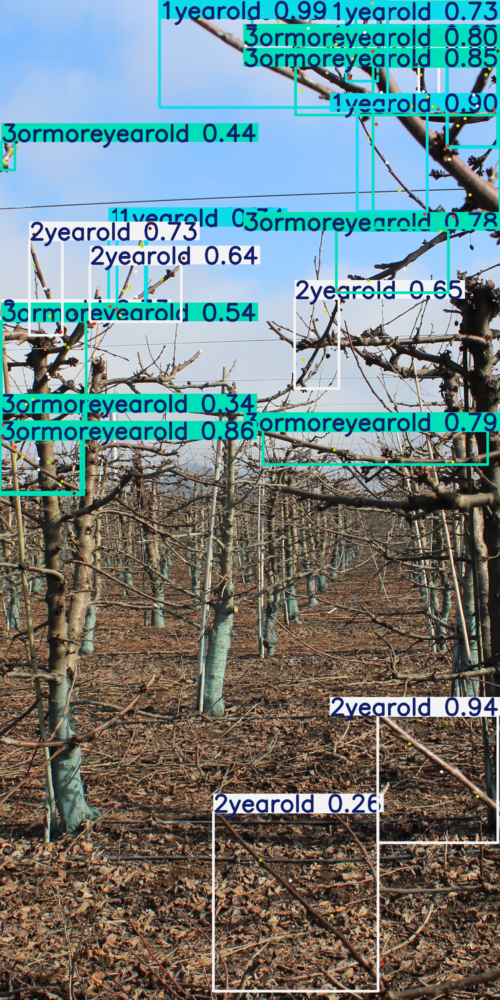

In [ ]:
img = results[0].show()  # This plots the detections on the image
